Run on NERSC

In [1]:
from __future__ import division, print_function
import sys, os, glob, time, warnings, gc
import matplotlib.pyplot as plt
import numpy as np
from astropy.table import Table, vstack, hstack
import fitsio
from astropy.io import fits
from astropy import wcs

In [2]:
params = {'legend.fontsize': 'large',
         'axes.labelsize': 'large',
         'axes.titlesize':'large',
         'xtick.labelsize':'large',
         'ytick.labelsize':'large',
         'figure.facecolor':'w'} 
plt.rcParams.update(params)

In [5]:
coadd_dir = '/global/project/projectdirs/cosmo/data/legacysurvey/dr8/south/coadd/'
tiles = ['1313m002', '1316m002', '1482p315', '1503p305', '1505p315', '1587p317']

bands = ['g', 'r', 'z']

(3600, 3600)


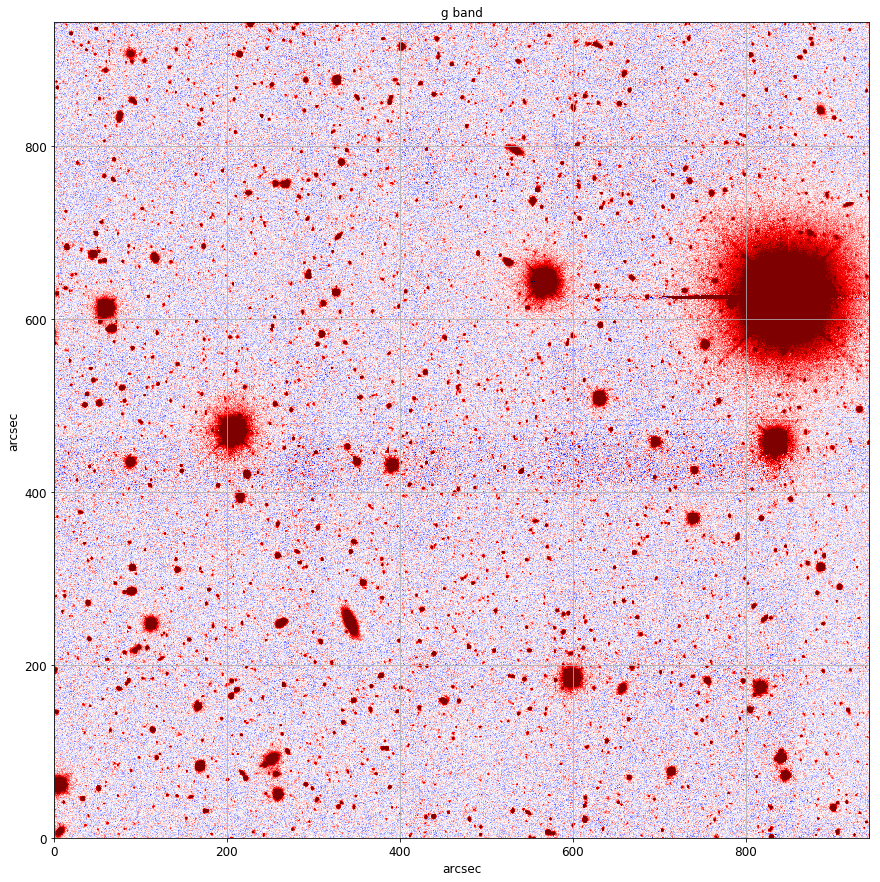

(3600, 3600)


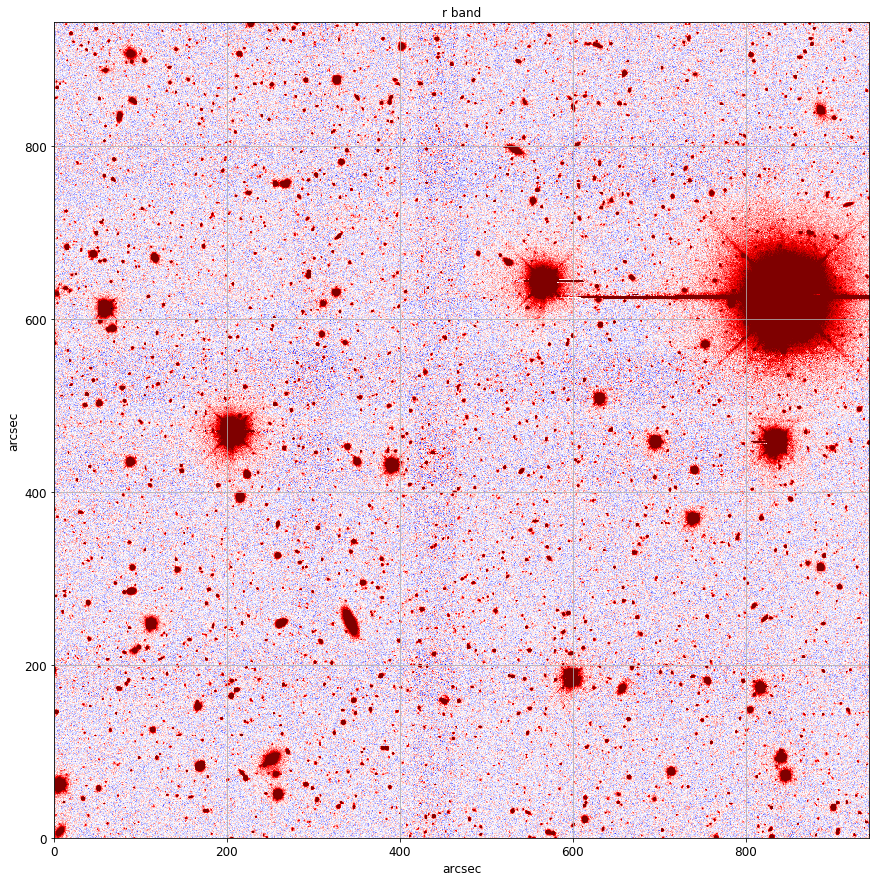

(3600, 3600)


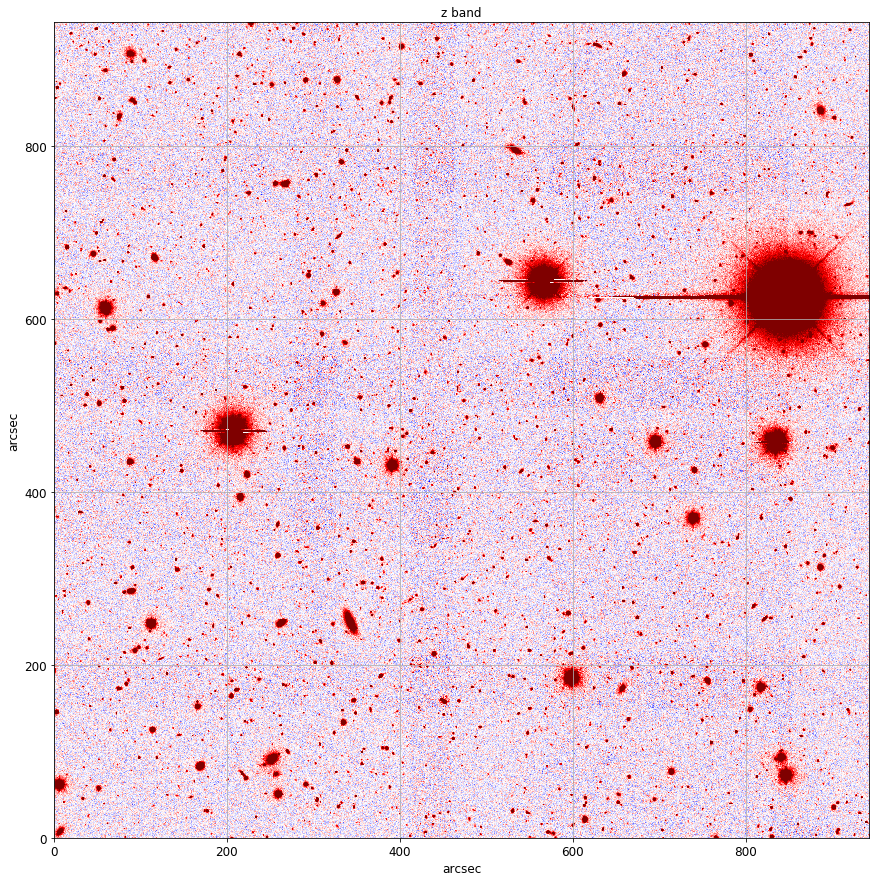

In [6]:
tile = tiles[2]

for band in bands:
    vranges = {'g':0.006, 'r':0.012, 'z':0.04}

    img = fits.getdata(os.path.join(coadd_dir, '{}/{}/legacysurvey-{}-image-{}.fits.fz'.format(tile[:3], tile, tile, band)))
    
    binsize = 4
    img1 = img.copy()
    # trim edges to enable downsizing
    # trimmed image size need to be multiples of binsize
    trim_size_x = img.shape[1] % binsize
    trim_size_y = img.shape[0] % binsize
    img1 = img1[trim_size_y:(img1.shape[0]-trim_size_y), trim_size_x:(img1.shape[1]-trim_size_x)]
    print(img1.shape)

    # to ignore NAN values, use np.nanmean
    img1 = np.mean(np.mean(img1.reshape((img1.shape[0]//binsize, binsize, img1.shape[1]//binsize,-1)), axis=3), axis=1)
    
    plt.figure(figsize=(16, 15))
    plt.imshow(img1, cmap='seismic', vmin=-vranges[band], vmax=vranges[band], origin='lower',
               extent=[0, 0.262*img.shape[1], 0, 0.262*img.shape[0]])
    plt.title('{} band'.format(band))
    plt.xlabel('arcsec')
    plt.ylabel('arcsec')
    # plt.grid()
    plt.show()

In [ ]:
for tile in tiles:
    
    for band in bands:
        
        vranges = {'g':0.006, 'r':0.012, 'z':0.04}

        img = fits.getdata(os.path.join(coadd_dir, '{}/{}/legacysurvey-{}-image-{}.fits.fz'.format(tile[:3], tile, tile, band)))

        binsize = 4
        img1 = img.copy()
        # trim edges to enable downsizing
        # trimmed image size need to be multiples of binsize
        trim_size_x = img.shape[1] % binsize
        trim_size_y = img.shape[0] % binsize
        img1 = img1[trim_size_y:(img1.shape[0]-trim_size_y), trim_size_x:(img1.shape[1]-trim_size_x)]
        print(img1.shape)

        # to ignore NAN values, use np.nanmean
        img1 = np.mean(np.mean(img1.reshape((img1.shape[0]//binsize, binsize, img1.shape[1]//binsize,-1)), axis=3), axis=1)

        plt.figure(figsize=(16, 15))
        plt.imshow(img1, cmap='seismic', vmin=-vranges[band], vmax=vranges[band], origin='lower',
                   extent=[0, 0.262*img.shape[1], 0, 0.262*img.shape[0]])
        plt.title('{} band'.format(band))
        plt.xlabel('arcsec')
        plt.ylabel('arcsec')
        # plt.grid()
        plt.tight_layout()
        plt.savefig('/global/homes/r/rongpu/notebooks/bright_star_profiles/dr9_debug/coadd_plots/{}_{}_dr8.png'.format(tile, band))
        plt.close()

----------
## Check sky background

In [10]:
dr8_metrics_dir = '/global/project/projectdirs/cosmo/data/legacysurvey/dr8/south/metrics/'
dr8_coadd_dir = '/global/project/projectdirs/cosmo/data/legacysurvey/dr8/south/coadd/'

In [18]:
for tile in tiles:
    
    for band in bands:

        vranges = {'g':0.006, 'r':0.012, 'z':0.04}

        img = fits.getdata(os.path.join(coadd_dir, '{}/{}/legacysurvey-{}-image-{}.fits.fz'.format(tile[:3], tile, tile, band)))
        blobs = fits.getdata(os.path.join(dr8_metrics_dir, '{}/blobs-{}.fits.gz'.format(tile[:3], tile, tile)))
        maskbits = fits.getdata(os.path.join(dr8_coadd_dir, '{}/{}/legacysurvey-{}-maskbits.fits.fz'.format(tile[:3], tile, tile)))

        mask = (blobs!=-1) | (maskbits&2**0>0)
        img1 = img.copy()
        img1[mask] = np.nan

        binsize = 4
        # trim edges to enable downsizing
        # trimmed image size need to be multiples of binsize
        trim_size_x = img.shape[1] % binsize
        trim_size_y = img.shape[0] % binsize
        img1 = img1[trim_size_y:(img1.shape[0]-trim_size_y), trim_size_x:(img1.shape[1]-trim_size_x)]
        # print(img1.shape)

        # to ignore NAN values, use np.nanmean
        img1 = np.nanmean(np.mean(img1.reshape((img1.shape[0]//binsize, binsize, img1.shape[1]//binsize,-1)), axis=3), axis=1)

        plt.figure(figsize=(16, 15))
        plt.imshow(img1, cmap='seismic', vmin=-vranges[band], vmax=vranges[band], origin='lower',
                   extent=[0, 0.262*img.shape[1], 0, 0.262*img.shape[0]])
        plt.title('{} band'.format(band))
        plt.xlabel('arcsec')
        plt.ylabel('arcsec')
        # plt.grid()
        plt.tight_layout()
        plt.savefig('/global/homes/r/rongpu/notebooks/bright_star_profiles/dr9_debug/coadd_plots_blobmask/{}_{}_dr8.png'.format(tile, band))
        plt.close()

/global/common/software/desi/cori/desiconda/20180709-1.2.6-spec/conda/lib/python3.6/site-packages/ipykernel/__main__.py:24: RuntimeWarning: Mean of empty slice


/global/common/software/desi/cori/desiconda/20180709-1.2.6-spec/conda/lib/python3.6/site-packages/ipykernel/__main__.py:24: RuntimeWarning: Mean of empty slice


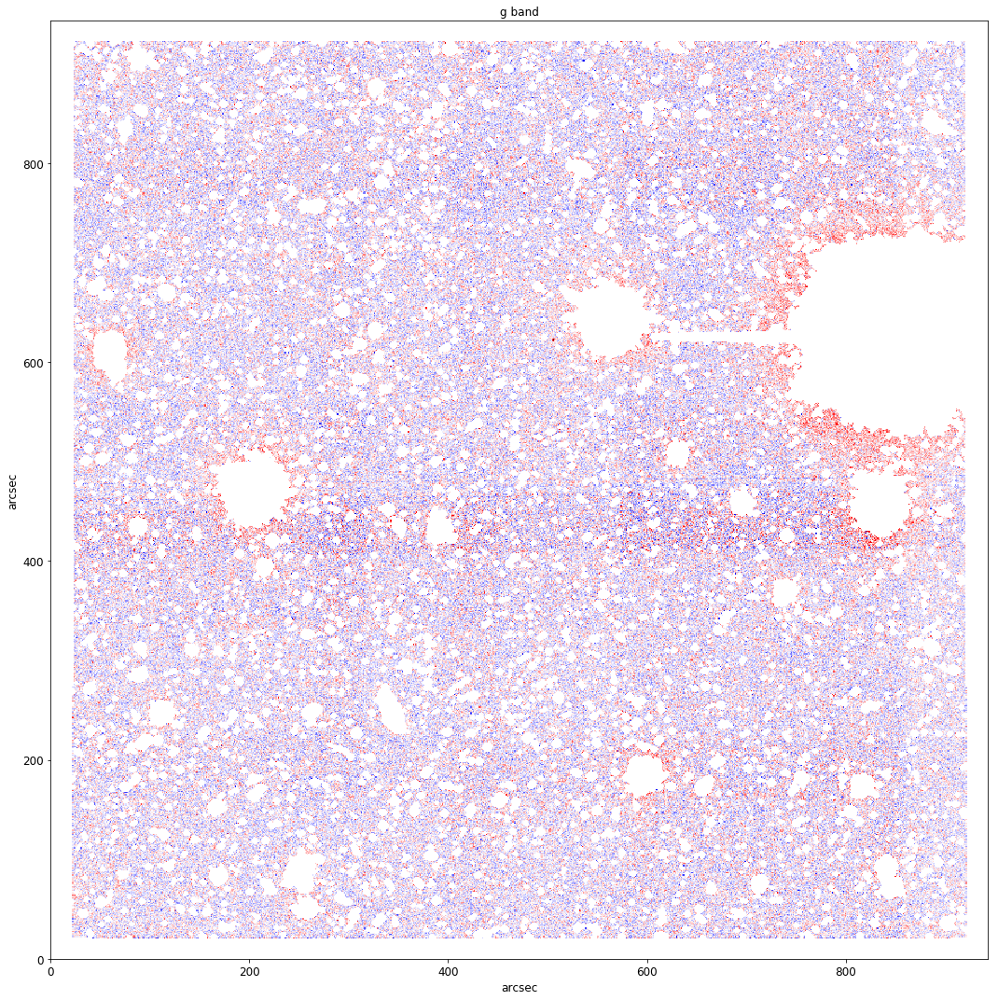

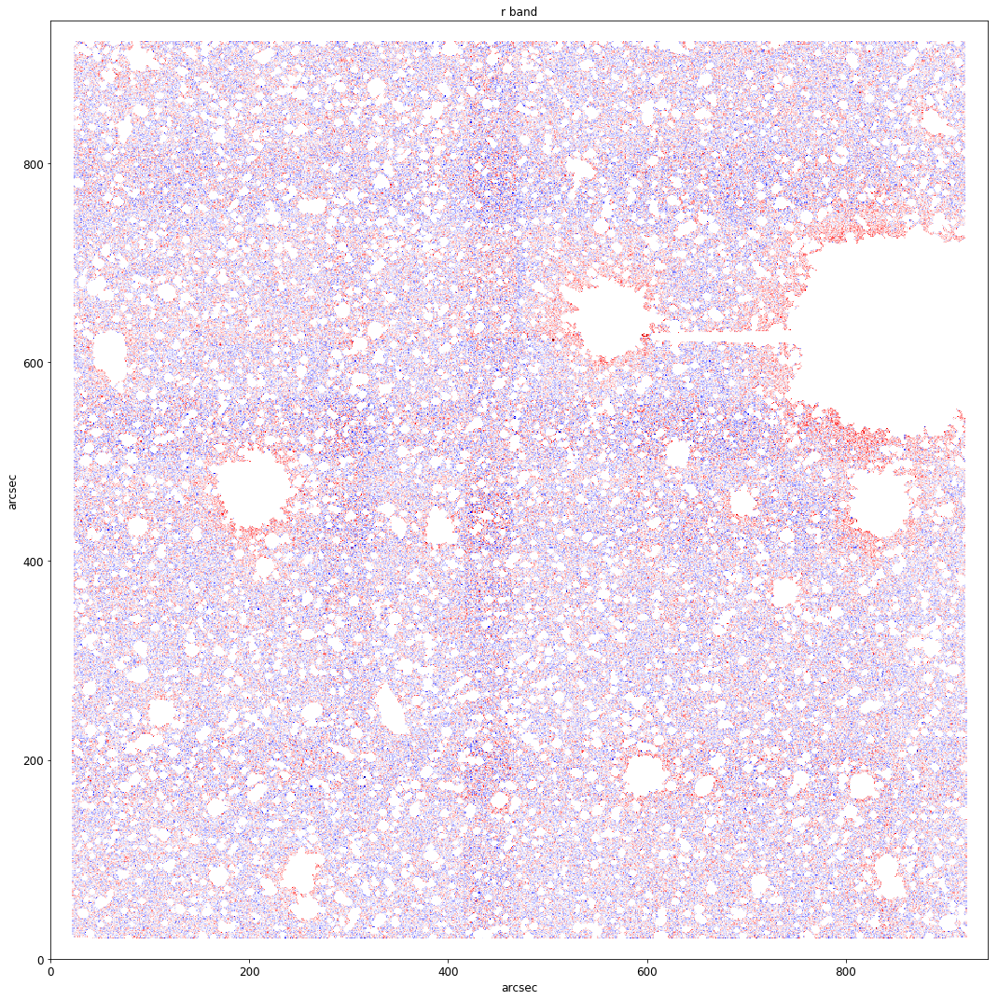

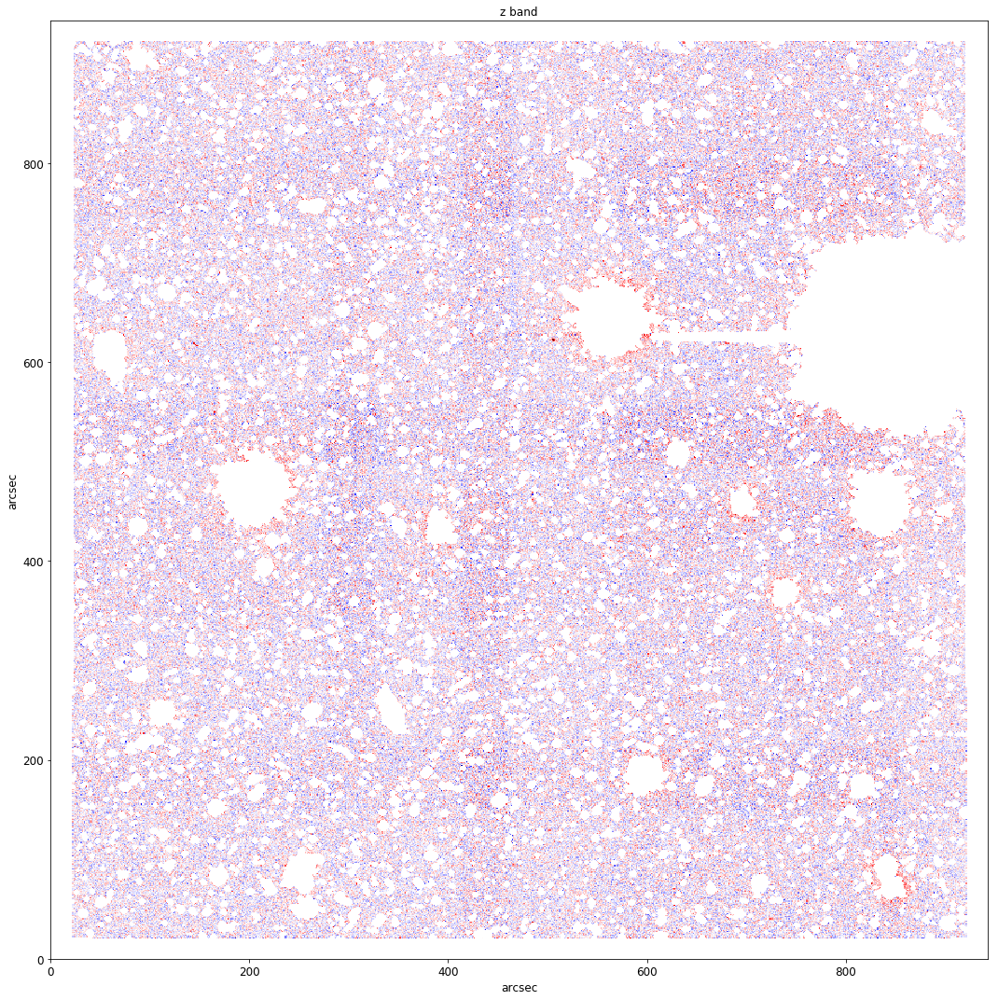

In [11]:
tile = tiles[2]
    
for band in bands:

    vranges = {'g':0.006, 'r':0.012, 'z':0.04}

    img = fits.getdata(os.path.join(coadd_dir, '{}/{}/legacysurvey-{}-image-{}.fits.fz'.format(tile[:3], tile, tile, band)))
    blobs = fits.getdata(os.path.join(dr8_metrics_dir, '{}/blobs-{}.fits.gz'.format(tile[:3], tile, tile)))
    maskbits = fits.getdata(os.path.join(dr8_coadd_dir, '{}/{}/legacysurvey-{}-maskbits.fits.fz'.format(tile[:3], tile, tile)))

    mask = (blobs!=-1) | (maskbits&2**0>0)
    img1 = img.copy()
    img1[mask] = np.nan

    binsize = 4
    # trim edges to enable downsizing
    # trimmed image size need to be multiples of binsize
    trim_size_x = img.shape[1] % binsize
    trim_size_y = img.shape[0] % binsize
    img1 = img1[trim_size_y:(img1.shape[0]-trim_size_y), trim_size_x:(img1.shape[1]-trim_size_x)]
    # print(img1.shape)

    # to ignore NAN values, use np.nanmean
    img1 = np.nanmean(np.mean(img1.reshape((img1.shape[0]//binsize, binsize, img1.shape[1]//binsize,-1)), axis=3), axis=1)

    plt.figure(figsize=(16, 15))
    plt.imshow(img1, cmap='seismic', vmin=-vranges[band], vmax=vranges[band], origin='lower',
               extent=[0, 0.262*img.shape[1], 0, 0.262*img.shape[0]])
    plt.title('{} band'.format(band))
    plt.xlabel('arcsec')
    plt.ylabel('arcsec')
    # plt.grid()
    plt.tight_layout()
    plt.show()

/global/common/software/desi/cori/desiconda/20180709-1.2.6-spec/conda/lib/python3.6/site-packages/numpy/lib/function_base.py:4016: RuntimeWarning: All-NaN slice encountered
  r = func(a, **kwargs)


-6.98316e-05


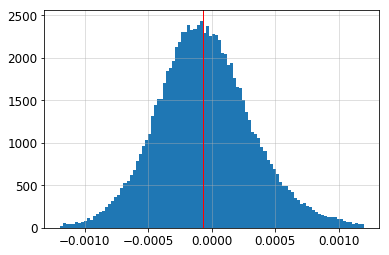

-5.34567e-05


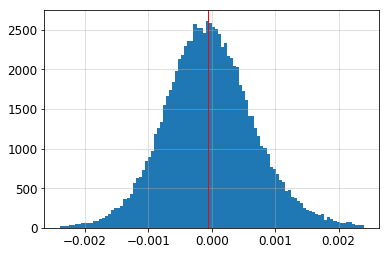

-5.66949e-05


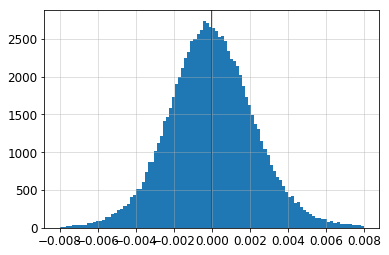

In [15]:
tile = tiles[2]
    
for band in bands:

    vranges = {'g':0.006, 'r':0.012, 'z':0.04}

    img = fits.getdata(os.path.join(coadd_dir, '{}/{}/legacysurvey-{}-image-{}.fits.fz'.format(tile[:3], tile, tile, band)))
    blobs = fits.getdata(os.path.join(dr8_metrics_dir, '{}/blobs-{}.fits.gz'.format(tile[:3], tile, tile)))
    maskbits = fits.getdata(os.path.join(dr8_coadd_dir, '{}/{}/legacysurvey-{}-maskbits.fits.fz'.format(tile[:3], tile, tile)))

    mask = (blobs!=-1) | (maskbits&2**0>0)
    img1 = img.copy()
    img1[mask] = np.nan
    
    binsize = 10
    # trim edges to enable downsizing
    # trimmed image size need to be multiples of binsize
    trim_size_x = img.shape[1] % binsize
    trim_size_y = img.shape[0] % binsize
    img1 = img1[trim_size_y:(img1.shape[0]-trim_size_y), trim_size_x:(img1.shape[1]-trim_size_x)]
    # print(img1.shape)

    # to ignore NAN values, use np.nanmean
    img1 = np.nanmedian(np.mean(img1.reshape((img1.shape[0]//binsize, binsize, img1.shape[1]//binsize,-1)), axis=3), axis=1)

    print(np.median(img1[np.isfinite(img1)]))
    plt.hist(img1[np.isfinite(img1)], 100, range=(-vranges[band]/5, vranges[band]/5))
    plt.axvline(np.median(img1[np.isfinite(img1)]), lw=1, color='red')
    plt.grid(alpha=0.5)
    plt.show()

/global/common/software/desi/cori/desiconda/20180709-1.2.6-spec/conda/lib/python3.6/site-packages/ipykernel/__main__.py:24: RuntimeWarning: Mean of empty slice


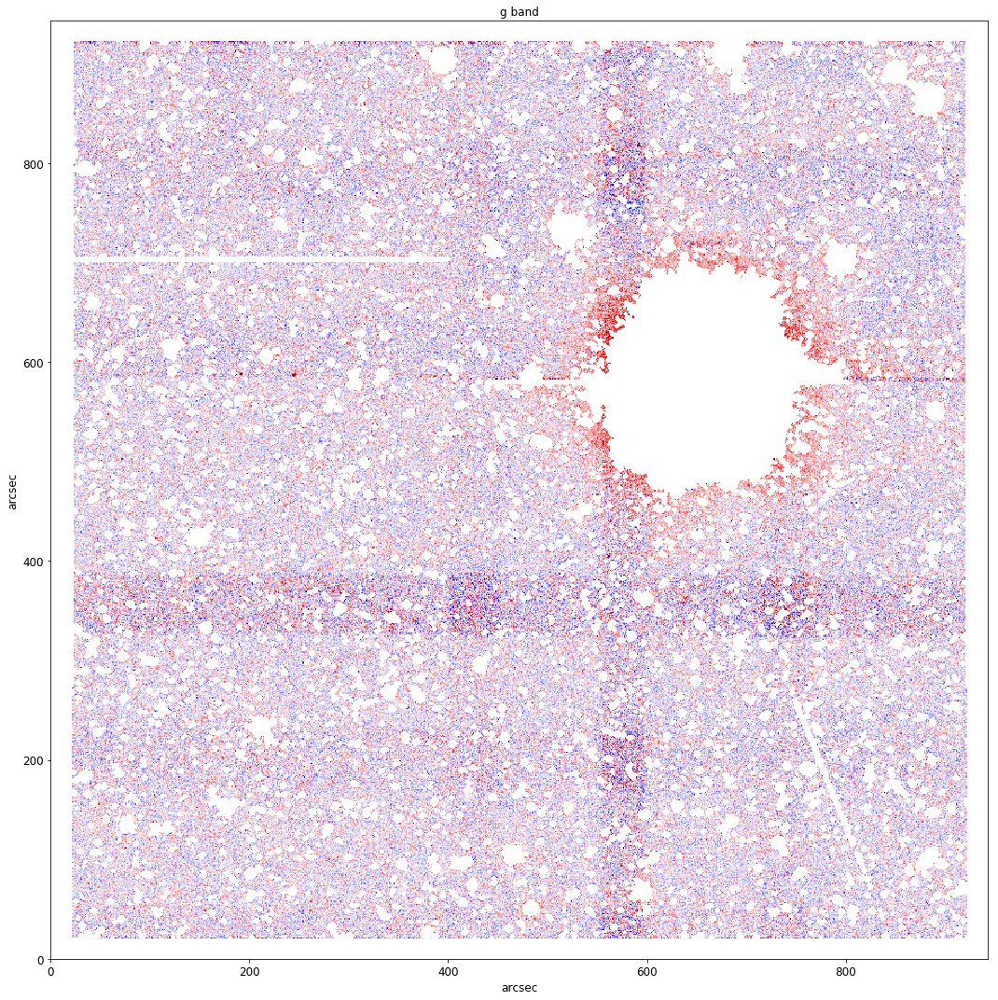

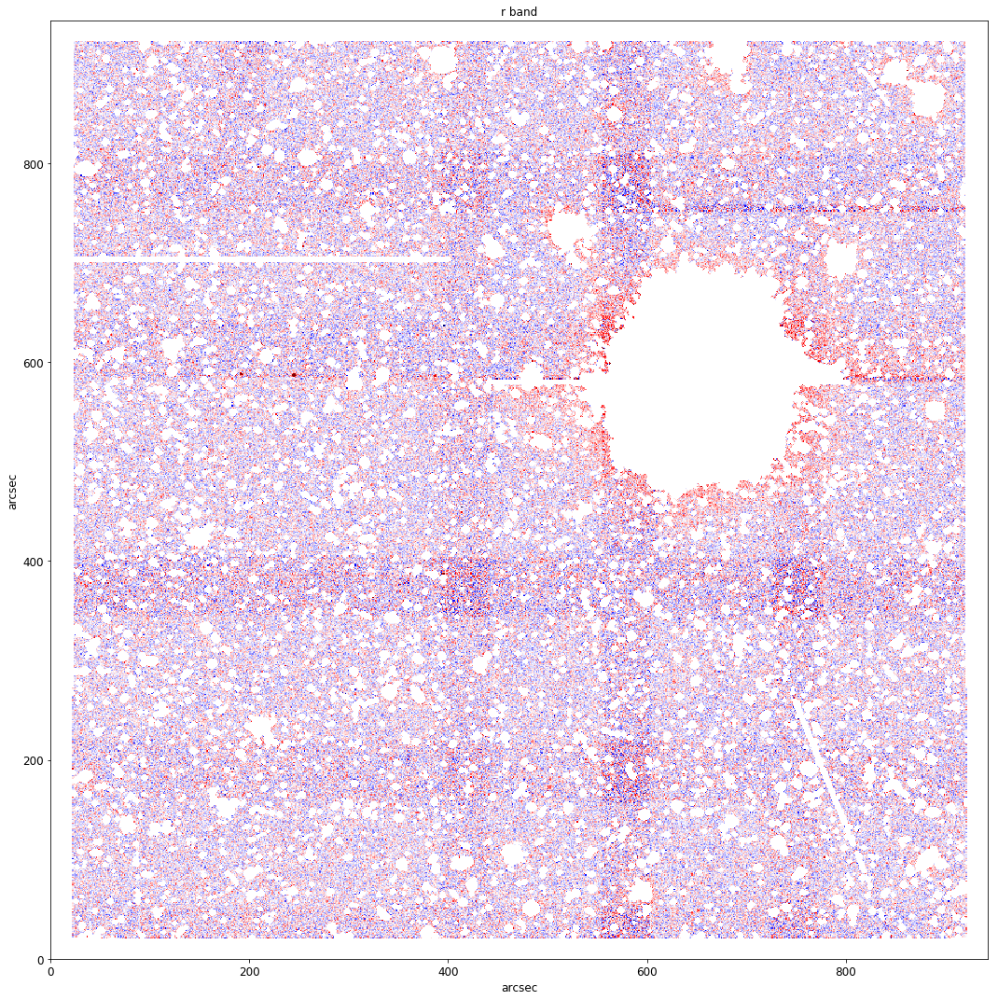

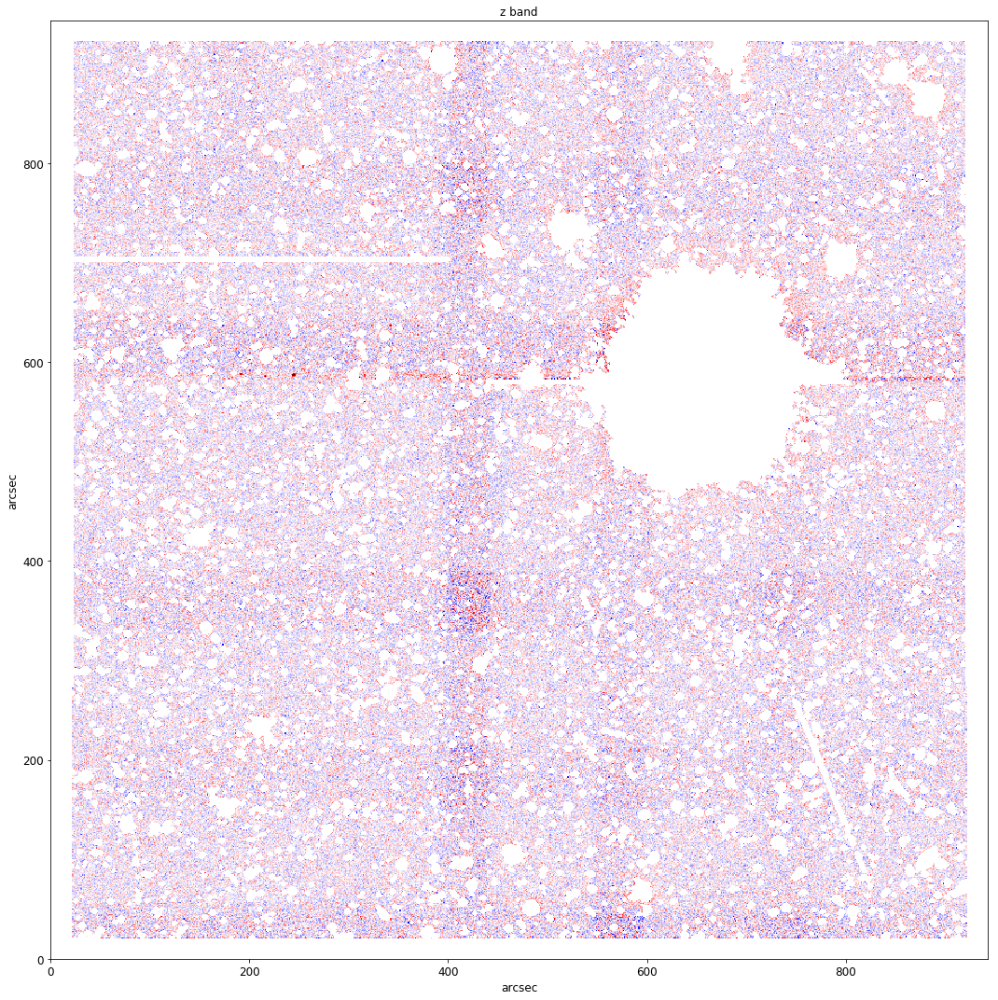

In [17]:
tile = tiles[4]
    
for band in bands:

    vranges = {'g':0.006, 'r':0.012, 'z':0.04}

    img = fits.getdata(os.path.join(coadd_dir, '{}/{}/legacysurvey-{}-image-{}.fits.fz'.format(tile[:3], tile, tile, band)))
    blobs = fits.getdata(os.path.join(dr8_metrics_dir, '{}/blobs-{}.fits.gz'.format(tile[:3], tile, tile)))
    maskbits = fits.getdata(os.path.join(dr8_coadd_dir, '{}/{}/legacysurvey-{}-maskbits.fits.fz'.format(tile[:3], tile, tile)))

    mask = (blobs!=-1) | (maskbits&2**0>0)
    img1 = img.copy()
    img1[mask] = np.nan

    binsize = 4
    # trim edges to enable downsizing
    # trimmed image size need to be multiples of binsize
    trim_size_x = img.shape[1] % binsize
    trim_size_y = img.shape[0] % binsize
    img1 = img1[trim_size_y:(img1.shape[0]-trim_size_y), trim_size_x:(img1.shape[1]-trim_size_x)]
    # print(img1.shape)

    # to ignore NAN values, use np.nanmean
    img1 = np.nanmean(np.mean(img1.reshape((img1.shape[0]//binsize, binsize, img1.shape[1]//binsize,-1)), axis=3), axis=1)

    plt.figure(figsize=(16, 15))
    plt.imshow(img1, cmap='seismic', vmin=-vranges[band], vmax=vranges[band], origin='lower',
               extent=[0, 0.262*img.shape[1], 0, 0.262*img.shape[0]])
    plt.title('{} band'.format(band))
    plt.xlabel('arcsec')
    plt.ylabel('arcsec')
    # plt.grid()
    plt.tight_layout()
    plt.show()

/global/common/software/desi/cori/desiconda/20180709-1.2.6-spec/conda/lib/python3.6/site-packages/numpy/lib/function_base.py:4016: RuntimeWarning: All-NaN slice encountered
  r = func(a, **kwargs)


-5.90221e-05


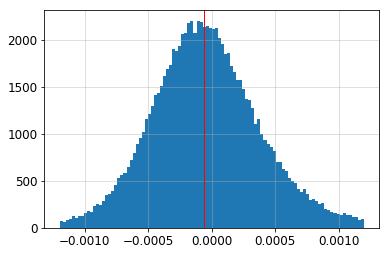

-4.28044e-05


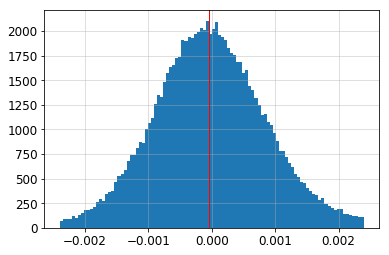

-4.29627e-05


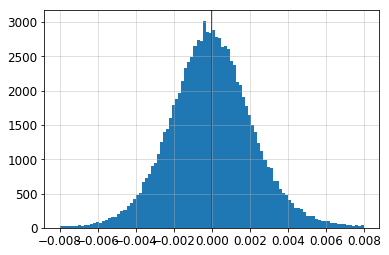

In [16]:
tile = tiles[4]
    
for band in bands:

    vranges = {'g':0.006, 'r':0.012, 'z':0.04}

    img = fits.getdata(os.path.join(coadd_dir, '{}/{}/legacysurvey-{}-image-{}.fits.fz'.format(tile[:3], tile, tile, band)))
    blobs = fits.getdata(os.path.join(dr8_metrics_dir, '{}/blobs-{}.fits.gz'.format(tile[:3], tile, tile)))
    maskbits = fits.getdata(os.path.join(dr8_coadd_dir, '{}/{}/legacysurvey-{}-maskbits.fits.fz'.format(tile[:3], tile, tile)))

    mask = (blobs!=-1) | (maskbits&2**0>0)
    img1 = img.copy()
    img1[mask] = np.nan
    
    binsize = 10
    # trim edges to enable downsizing
    # trimmed image size need to be multiples of binsize
    trim_size_x = img.shape[1] % binsize
    trim_size_y = img.shape[0] % binsize
    img1 = img1[trim_size_y:(img1.shape[0]-trim_size_y), trim_size_x:(img1.shape[1]-trim_size_x)]
    # print(img1.shape)

    # to ignore NAN values, use np.nanmean
    img1 = np.nanmedian(np.mean(img1.reshape((img1.shape[0]//binsize, binsize, img1.shape[1]//binsize,-1)), axis=3), axis=1)

    print(np.median(img1[np.isfinite(img1)]))
    plt.hist(img1[np.isfinite(img1)], 100, range=(-vranges[band]/5, vranges[band]/5))
    plt.axvline(np.median(img1[np.isfinite(img1)]), lw=1, color='red')
    plt.grid(alpha=0.5)
    plt.show()